# <center>Intelligent Automation: Pre-screen Applications using a Classification Model</center>


![DonorsChoose Kaggle Competition](images/DonorsChoose.png)
[source](https://www.kaggle.com/c/donorschoose-application-screening)

![PyCaret](images/pycaret2.2.png)

[source](https://medium.com/analytics-vidhya/pycaret-prepare-your-machine-learning-model-in-minutes-db7525d8615l)

# Task 1 : Introduction and setup of the environment

## Introduction
### Business Objective
Predict whether a DonorsChoose.org project proposal submitted by a teacher will be approved
### Technical Objectives
* Build an end-to-end Classification Model using PyCaret

### Prerequisite
* Basic knowlege of Pandas
* A high level understanding of Machine Learning.

### PyCaret
> PyCaret is an open source, low-code machine learning library in Python that automates machine learning workflow (Moez Ali, founder & Author of PyCaret)


![PyCaret functions](images/PyCaretFunctions1.png)
![PyCaret functions](images/PyCaretFunctions2.png)


### Resources
* [PyCaret Official documentation](https://pycaret.readthedocs.io/en/latest)
* [DonorsChoose Kaggle Competition](https://www.kaggle.com/c/donorschoose-application-screening)




## Import Librairies

In [4]:
#First, we’ll use pandas to manipulate our data.
import pandas as pd

#Next, we import ProfileReport from the pandas_profiling library with which we will use to quickly do an exploratory data analysis with just a one line of code
from pandas_profiling import ProfileReport

#Finally, we import the module Classification from the library PyCaret.
from pycaret.classification import *
#PyCaret is a low-code Python Open-Source Machine Learning library
#The goal of PyCaret is to automate the major steps for building, evaluating and comparing ML models for classification and regression.

In [5]:
print('PyCaret: %s' % pycaret.__version__)

PyCaret: 2.3.6


# Task 2 : Load and Prepare Data

In [6]:
#Let’s start by loading the two datasets Projects and Resources into dataframes using the pandas function read_csv.

projects = pd.read_csv('data/Projects.csv')
resources = pd.read_csv('data/resources.csv')

In [7]:
#Let's have alook to the shapes and the first few rows of the 2 dataframes

projects.shape

(20000, 15)

In [8]:
#Now let’s list the variables for each of the two Dataframes:

projects.dtypes

Unnamed: 0                                       int64
id                                              object
teacher_id                                      object
teacher_prefix                                  object
school_state                                    object
project_submitted_datetime                      object
project_grade_category                          object
project_subject_categories                      object
project_subject_subcategories                   object
project_title                                   object
project_essay_1                                 object
project_essay_2                                 object
project_resource_summary                        object
teacher_number_of_previously_posted_projects     int64
project_is_approved                              int64
dtype: object

* Project_Id is a unique identifier for the project.

* Teacher_id is a unique identifier for the teacher of the project.
* Teacher_prefix: Teacher’s title
* School state: State where school is located.
* project_submitted_datetime: datetime when project application was submitted.
* project_grade_category: Grade level of students for which the project is targeted.
* project_subject_categories: One or more (comma-separated) subject categories for the project
* project_subject_subcategories: One or more (comma-separated) subject subcategories for the project
* project_title: title of the project
* project_essay_1: first application essay (“"Describe your students: What makes your students special? Specific details about their background, your neighborhood, and your school are all helpful."
* project_essay_2: second application essay (“About your project: How will these materials make a difference in your students' learning and improve their school lives?")
* project_resource_summary: An explanation of the resources needed for the project.
* teacher_number_of_previously_posted_projects: Number of project applications previously submitted by the same teacher.
* project_is_approved: A binary flag indicating whether DonorsChoose approved the project. A value of 0 indicates the project was not approved, and a value of 1 indicates the project was approved.


In [9]:
#Let’s take a look to the features of the resources dataframe.
resources.dtypes

Unnamed: 0       int64
id              object
description     object
quantity         int64
price          float64
dtype: object

* Id: A project_id value from the project dataframe. It will be used to merge the two table later.
* Description: Description of the resource
* Quantity: Quantity of the resource required
* Price: Price of the resource required


In [10]:
resources['cost'] = resources['quantity'] * resources['price']

In [11]:
resources.head()

,Unnamed: 0,id,description,quantity,price,cost
0,0,p093253,DD287 - Show What You Know Math Performance Ta...,1,29.99,29.99
1,1,p093253,DD424 - Math Strategies Magnetic Teaching Char...,1,19.99,19.99
2,2,p093253,LL795 - Step-By-Step Bar Model Activity Cards ...,1,39.99,39.99
3,3,p093253,PP389 - Problem Solving Card Bank - Gr. 4-5,1,49.99,49.99
4,4,p093253,PP400X - Math in a Flash! Discovery Cans - Gr....,1,75.00,75.00


In [12]:
#A project can have one or more resources. Before merging project and resources we need to aggregate data by project.

resources_aggregated = resources.groupby('id').agg({'description': ['nunique'], 'quantity': ['sum'], 'cost': ['mean', 'sum']})
resources_aggregated.columns = ['unique_items', 'total_quantity', 'mean_cost', 'total_cost']
resources_aggregated.reset_index(inplace=True)
resources_aggregated.head()

,id,unique_items,total_quantity,mean_cost,total_cost
0,p000007,1,6,947.880000,947.88
1,p000008,64,80,3.712375,296.99
2,p000016,2,60,93.600000,187.20
3,p000031,2,2,178.990000,357.98
4,p000062,3,8,84.673333,254.02


### Merge Ressources and Projects
Now we can merge the 2 dataframes projects and resources_aggregated.

In [13]:
df = pd.merge(projects, resources_aggregated, how='left', on='id')

# Task 3 : Prepare Text data
We have several features with text data: project_title, project_resource_summary, project_essay_1 and project_essay_2. 

In this project we will not use NLP to preprocess these features. We will only create new features based on the length of text.

So, let’s create these new features

In [14]:

df['len_project_title'] = df['project_title'].apply(lambda x: len(x))
df['len_project_resource_summary'] = df['project_resource_summary'].apply(lambda x: len(x))
df['len_project_essay_1'] = df['project_essay_1'].apply(lambda x: len(x))
df['len_project_essay_2'] = df['project_essay_2'].apply(lambda x: len(x))


Next let’s look at the variable project_subject_categories. 

It contains a list of categories separated by a comma.

First let’s create a variable which contains the number of categories for a given project.

In [15]:
df['Number_project_subject_categories'] = df['project_subject_categories'].apply(lambda x: len(x.split(',')))

In [16]:
#Let's look at the distribution of the variable Number_project_subject_categories.
df.Number_project_subject_categories.value_counts()  ## normalize=True

1    12030
2     7954
3       16
Name: Number_project_subject_categories, dtype: int64

In [17]:
#Let's created the variables project_subject_categories1, project_subject_categories2 and project_subject_categories3.
df['project_subject_category1'], df['project_subject_category2'], df['project_subject_category3'] = df.project_subject_categories.str.split(",",2).str

In [18]:
#Let's look at the different values of the variable project_subject_category1
df.project_subject_category1.value_counts(normalize=True)

Literacy & Language    0.41375
Math & Science         0.22765
Health & Sports        0.12110
Applied Learning       0.09335
Music & The Arts       0.04730
Special Needs          0.04280
History & Civics       0.04050
Warmth                 0.01355
Name: project_subject_category1, dtype: float64

## Split data
Finally, before ending the task 2, we will split the dataframe into train and test.

In [19]:

df_train = df.sample(frac=0.95, random_state=123)
df_test = df.drop(df_train.index)

df_train.reset_index(drop=True, inplace=True)
df_test.reset_index(drop=True, inplace=True)

# Task 4 : Explore Data.



In [20]:
ProfileReport(df_train) #, minimal=True)

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.94s/it]


# Task 5: Preprocess Data
![Setup PyCaret](images/PyCaretPreprocessing1.png)
![Setup PyCaret](images/PyCaretPreprocessing2.png)

[source](https://towardsdatascience.com/announcing-pycaret-an-open-source-low-code-machine-learning-library-in-python-4a1f1aad8d46)

In [22]:
mySetup = setup(
                data = df_train, 
                target = 'project_is_approved', 
                session_id = 123,  
                fold = 5,
                ignore_features = ['id','teacher_id','project_submitted_datetime','school_state', 'project_subject_categories',
                                    'project_subject_subcategories', 'project_essay_1','project_essay_2','project_resource_summary','project_title'],
               
                normalize = True #, 
               # fix_imbalance = True
               )

# Let's call the fuction (first moment of magic (WOW) from PyCaret)

,Description,Value
0,session_id,123
1,Target,project_is_approved
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(19000, 27)"
5,Missing Values,True
6,Numeric Features,10
7,Categorical Features,6
8,Ordinal Features,False
9,High Cardinality Features,False


# Task 6 : Build Classification Model

In [23]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


let's create our first model using the function create_model

we are going to train a (simple) decision tree model for which we must pass “dt” and it will return a table with k-fold cross-validated scores of common evaluation metrics used for classification models.

In [24]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.7485,0.5352,0.8436,0.8569,0.8502,0.0680,0.0681
1,0.7451,0.5301,0.8413,0.8549,0.8481,0.0582,0.0582
2,0.7481,0.5339,0.8439,0.8561,0.8500,0.0657,0.0658
3,0.7421,0.5234,0.8399,0.8528,0.8463,0.0452,0.0453
4,0.7390,0.5256,0.8341,0.8539,0.8439,0.0487,0.0488
Mean,0.7446,0.5296,0.8406,0.8549,0.8477,0.0572,0.0572
SD,0.0036,0.0046,0.0035,0.0015,0.0024,0.0090,0.0090


Let’s take a look at the results. The decision tree model has an AUC of 0.52.

In [25]:
#We can print the hyperparameters of the decision tree model
print(dt)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')


In [26]:

compare_models(
               fold = 5,  
               sort = 'AUC'
               )



,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
gbc,Gradient Boosting Classifier,0.8442,0.7114,0.9940,0.8479,0.9152,0.0283,0.0675,1.0500
ada,Ada Boost Classifier,0.8454,0.7019,0.9938,0.8491,0.9158,0.0427,0.0968,0.2220
catboost,CatBoost Classifier,0.8437,0.7013,0.9896,0.8502,0.9146,0.0544,0.1009,25.2760
lr,Logistic Regression,0.8444,0.6966,0.9951,0.8475,0.9154,0.0231,0.0615,0.6280
lda,Linear Discriminant Analysis,0.8422,0.6925,0.9905,0.8483,0.9139,0.0323,0.0654,0.0680
lightgbm,Light Gradient Boosting Machine,0.8431,0.6902,0.9878,0.8507,0.9142,0.0602,0.1055,0.5940
rf,Random Forest Classifier,0.8453,0.6819,0.9958,0.8478,0.9159,0.0275,0.0738,0.5360
xgboost,Extreme Gradient Boosting,0.8358,0.6662,0.9730,0.8534,0.9093,0.0833,0.1111,2.1440
et,Extra Trees Classifier,0.8450,0.6521,0.9960,0.8475,0.9157,0.0231,0.0662,0.7080
nb,Naive Bayes,0.3308,0.6175,0.2421,0.9039,0.3039,0.0342,0.0681,0.0400


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

To accelerate the execution of the function we can use the parameter budget_time to terminate after budget_time minutes have passed, and return results up to that point.

Also, we can choose to include or exclude a list of models from the evaluation which will accelerate the execution of the function.


we can see that the “Gradient Boosting Model has the best AUC (0.68).

In order to pick the best model, we will call the function automl. We will pass the value “AUC” in Optimize parameter.

In [27]:
bestModel = automl(optimize = 'AUC')

In [28]:
print(bestModel)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


## 'Fine Tuning' du Systeme

We can tune model hyperparameters using the tune_model function.

The function takes an instance of the model to tune as input. A random search of model hyperparameters is performed. We can control the total number of evaluations via the “n_iter” argument.

By default, the function will optimize the Accuracy and will evaluate the performance of each configuration using 10-fold cross-validation.
Let’s start by changing the Optimize parameter to “AUC”.


In [29]:

tuned_bestModel = tune_model(bestModel,
                             optimize = 'AUC',
                            )

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8459,0.7048,1.0000,0.8459,0.9165,0.0000,0.0000
1,0.8459,0.6925,1.0000,0.8458,0.9165,0.0041,0.0454
2,0.8455,0.7052,1.0000,0.8455,0.9163,0.0000,0.0000
3,0.8459,0.7208,1.0000,0.8458,0.9165,0.0041,0.0454
4,0.8458,0.7230,1.0000,0.8458,0.9165,0.0000,0.0000
Mean,0.8458,0.7093,1.0000,0.8458,0.9164,0.0016,0.0181
SD,0.0001,0.0113,0.0000,0.0001,0.0001,0.0020,0.0222


In [30]:
print(tuned_bestModel)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.01, loss='deviance', max_depth=7,
                           max_features='sqrt', max_leaf_nodes=None,
                           min_impurity_decrease=0.05, min_impurity_split=None,
                           min_samples_leaf=2, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=140,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=123, subsample=0.35, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


# Task 7 : Evaluate Model



Let’s call the function plot_model. It takes as mandatory parameter the model object. Next, we can choose the type of plot. By default, the function will plot the AUC curve.

So, let’s plot the AUC-ROC curve for our best model.

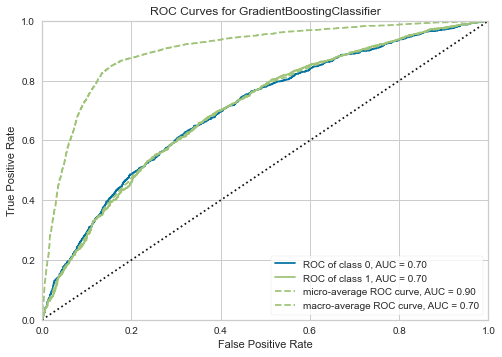

In [31]:
plot_model(tuned_bestModel)

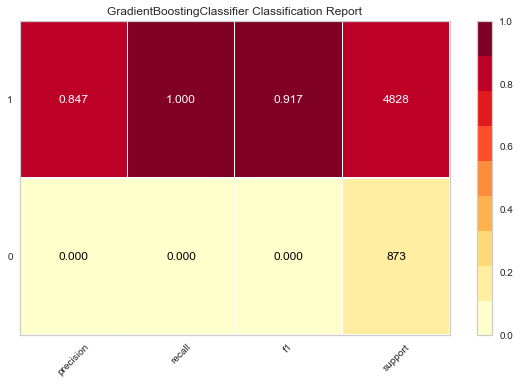

In [32]:
plot_model(tuned_bestModel, plot='class_report')

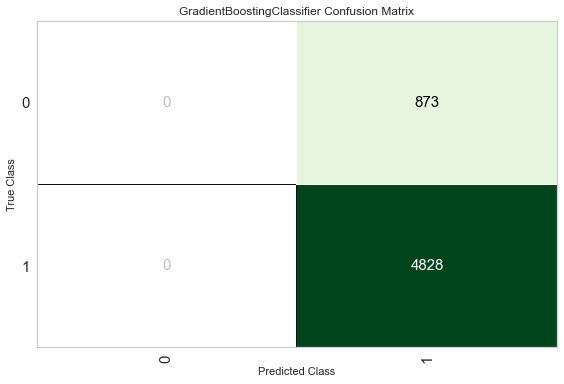

In [33]:
plot_model(tuned_bestModel,plot='confusion_matrix')


In [ ]:
plot_model(tuned_bestModel,plot='boundary')

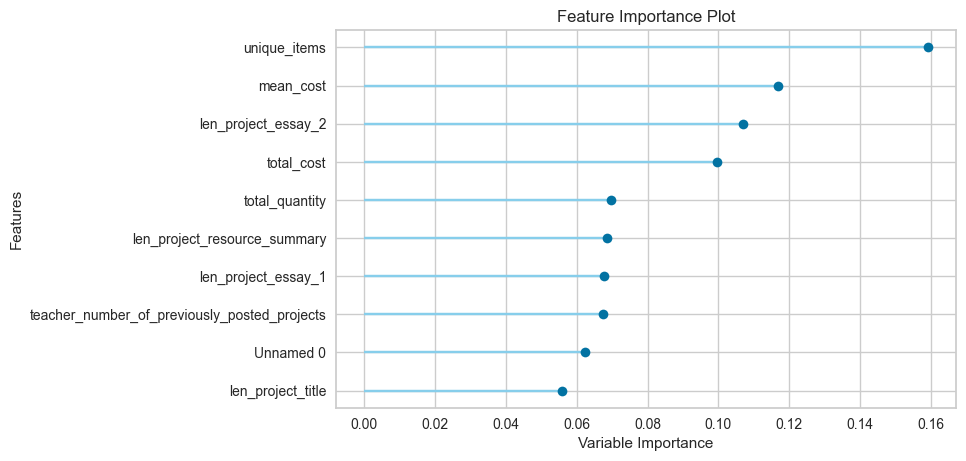

In [34]:
## Feature importance plot
plot_model(tuned_bestModel,plot='feature')

# Task 8 : Interpret and Explain the final Model

In [35]:
xgboost = create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.8353,0.6569,0.9698,0.8550,0.9088,0.0964,0.1232
1,0.8323,0.6546,0.9693,0.8526,0.9072,0.0750,0.0975
2,0.8323,0.6504,0.9733,0.8501,0.9075,0.0505,0.0702
3,0.8406,0.6803,0.9773,0.8549,0.9120,0.1026,0.1403
4,0.8383,0.6885,0.9751,0.8543,0.9107,0.0921,0.1243
Mean,0.8358,0.6662,0.9730,0.8534,0.9093,0.0833,0.1111
SD,0.0033,0.0153,0.0031,0.0019,0.0019,0.0188,0.0246


### Global model interpretations


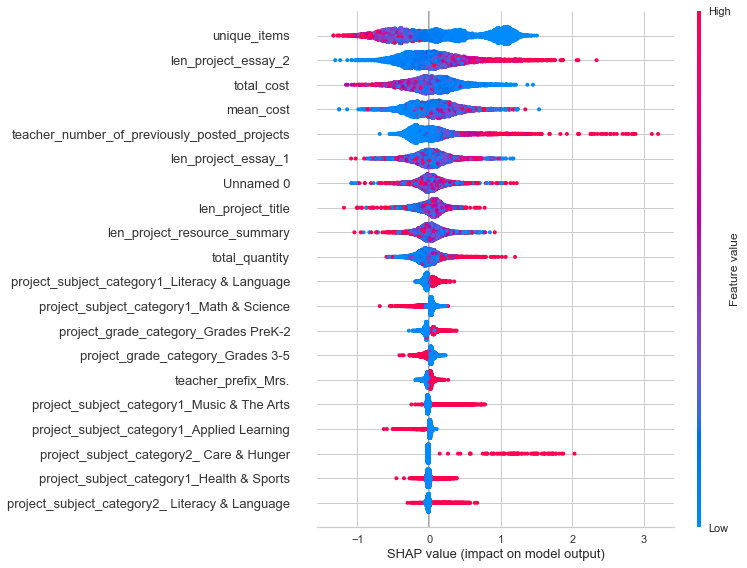

In [36]:
interpret_model(xgboost,
                plot= 'summary'
               )

### Local model interpretation
Next we will look how we can explain model prediction at individual level looking how it is different from the baseline.

The goal of SHAP is to explain the prediction of an instance x by computing the contribution of each feature to the prediction

In [37]:
interpret_model(xgboost,
                plot='reason', 
                observation = 1
               )

# Task 9 : Deploy Model

In [38]:
final_model = finalize_model(tuned_bestModel)

In [39]:
pred_test = predict_model(final_model, data = df_test)

In [40]:
pred_test.head()

,Unnamed: 0,id,teacher_id,teacher_prefix,school_state,project_submitted_datetime,project_grade_category,project_subject_categories,project_subject_subcategories,project_title,...,len_project_title,len_project_resource_summary,len_project_essay_1,len_project_essay_2,Number_project_subject_categories,project_subject_category1,project_subject_category2,project_subject_category3,Label,Score
0,4158,p072356,eea03c8cc41cfa4eace438fb64849d9d,Mrs.,LA,2016-09-17 18:55,Grades PreK-2,"Literacy & Language, Math & Science","Literacy, Mathematics",Technology Savy,...,15,153,1010,637,2,Literacy & Language,Math & Science,NaN,1,0.9186
1,129568,p036477,882ed442b158ba0f14ca3dffb0a544ea,Ms.,NJ,2016-10-08 13:48,Grades 6-8,"Math & Science, Literacy & Language","Environmental Science, Literature & Writing",Read to Learn,...,13,91,600,692,2,Math & Science,Literacy & Language,NaN,1,0.8549
2,167090,p168015,909a68cb4181142618389381ebb196b2,Ms.,PA,2016-09-23 8:33,Grades 9-12,"Literacy & Language, Special Needs","Literacy, Special Needs","Keeping up with the TIME, scholastically!",...,41,70,495,559,2,Literacy & Language,Special Needs,NaN,1,0.8203
3,63082,p202773,ba74c82755f9d5007a5894bcb4438525,Mrs.,AZ,2016-06-25 5:05,Grades 6-8,"History & Civics, Applied Learning","Civics & Government, College & Career Prep","Refurbished Chromebooks Are \""GOLD\"" in This C...",...,55,185,1111,939,2,History & Civics,Applied Learning,NaN,1,0.8793
4,167836,p026488,928c4c80bef13b306031b2205da893c1,Mrs.,MI,2016-08-01 12:37,Grades 6-8,Health & Sports,Health & Wellness,Farm to Table: Making Informed Decisions About...,...,58,172,571,1056,1,Health & Sports,NaN,NaN,1,0.8663


In [41]:

## Save the final Modele
save_model(final_model, 'FinalModel')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=[],
                                       display_types=True,
                                       features_todrop=['id', 'teacher_id',
                                                        'project_submitted_datetime',
                                                        'school_state',
                                                        'project_subject_categories',
                                                        'project_subject_subcategories',
                                                        'project_essay_1',
                                                        'project_essay_2',
                                                        'project_resource_summary',
                                                        'project_title'],
                                       id_columns=[],
                                       ml_usecase='cl..